<a href="https://colab.research.google.com/github/MendyData/Analyse_Logistique/blob/main/Gomis_Angele_2_SmartCity_102024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install plotly

Smart City

# Introduction : présentation du projet et des objectifs

Ce projet vise à analyser les données des arbres de la ville de Paris. L'objectif est d'identifier les espèces les plus présentes, leur répartition géographique et d'autres informations pertinentes pour une meilleure gestion du patrimoine arboré

## Résumé des étapes :

1. Clonage du dépôt GitHub Analyse logistique dans Colab.
2. Configuration de l'identité Git avec nom et email.
3. Copie du notebook Gomis_Angele_2_SmartCity_102024.ipynb dans le dépôt.
4. Ajout, commit et envoi du notebook vers GitHub.

# 1. Mise en place de l'environnement

In [2]:
# Téléchargement des bibliothèques
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
!git clone https://github.com/MendyData/Analyse_Logistique.git

fatal: destination path 'Analyse_Logistique' already exists and is not an empty directory.


In [4]:
!ls /content/Analyse_Logistique/

README.md


In [5]:
!git config --global user.name "MendyData"
!git config --global user.email "mendy.data@gmail.com"

In [6]:
#  Copie du notebook dans le dépôt cloné
!cp /content/Gomis_Angele_2_SmartCity_102024.ipynb /content/Analyse_Logistique/


cp: cannot stat '/content/Gomis_Angele_2_SmartCity_102024.ipynb': No such file or directory


In [7]:
# Ajouter et committer le notebook à Git
!git add Gomis_Angele_2_SmartCity_102024.ipynb
!git commit -m "Ajout du notebook Gomis_Angele_2_SmartCity_102024 depuis Google Colab"

fatal: not a git repository (or any of the parent directories): .git
fatal: not a git repository (or any of the parent directories): .git


In [8]:
# Verification du clonage
!git clone https://github.com/MendyData/Analyse_Logistique.git

fatal: destination path 'Analyse_Logistique' already exists and is not an empty directory.


In [9]:
# Envoi du fichier vers GitHub
!git push origin master

fatal: not a git repository (or any of the parent directories): .git


In [10]:
# Installation de pandas, numpy, matplotlib et d'autres librairies nécessaires
#!pip install pandas numpy matplotlib seaborn folium
/

()

# 2. Chargement des données & premières analyses

In [11]:
import pandas as pd

# URL du fichier CSV
csv_url = "https://opendata.paris.fr/explore/dataset/les-arbres/download/?format=csv"

# Charger les données dans un DataFrame pandas
df = pd.read_csv(csv_url, sep=';')

# Afficher les premières lignes pour vérifier le chargement
df.head()


,idbase,typeemplacement,domanialite,arrondissement,complementadresse,numero,adresse,idemplacement,libellefrancais,genre,espece,varieteoucultivar,circonferenceencm,hauteurenm,stadedeveloppement,remarquable,geo_point_2d
0,297916,Arbre,Alignement,PARIS 20E ARRDT,NaN,NaN,COURS DE VINCENNES,000101013,Marronnier,Aesculus,hippocastanum,NaN,20,5,Jeune (arbre),NON,"48.84803829215288,2.4014131327475097"
1,141281,Arbre,CIMETIERE,VAL-DE-MARNE,NaN,NaN,CIMETIERE DE THIAIS / AVENUE O / DIV 16,A13800016002,Erable,Acer,platanoides,NaN,20,5,NaN,NON,"48.76692991834873,2.37661743734158"
2,223035,Arbre,Alignement,PARIS 7E ARRDT,181,NaN,BOULEVARD SAINT GERMAIN,004101007,Platane,Platanus,x hispanica,NaN,50,10,Jeune (arbre),NON,"48.854607686654305,2.3296262087110096"
3,138704,Arbre,Jardin,PARIS 18E ARRDT,NaN,NaN,SQUARE DE LA RUE CHARLES HERMITE / 38 RUE CHAR...,000201021,Erable,Acer,negundo,NaN,64,7,Jeune (arbre)Adulte,NON,"48.90032327015565,2.3668887792161994"
4,139676,Arbre,Jardin,PARIS 16E ARRDT,NaN,NaN,SQUARE ROGER COQUOIN / 14 AVENUE FERDINAND BUI...,000202001,Cyprès,Cupressus,arizonica,NaN,135,12,Mature,NON,"48.836266139744666,2.2553349385923687"


In [43]:
# Affichage des colonnes du DataFrame
df.columns

Index(['idbase', 'typeemplacement', 'domanialite', 'arrondissement',
       'complementadresse', 'numero', 'adresse', 'idemplacement',
       'libellefrancais', 'genre', 'espece', 'varieteoucultivar',
       'circonferenceencm', 'hauteurenm', 'stadedeveloppement', 'remarquable',
       'geo_point_2d'],
      dtype='object')

In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211412 entries, 0 to 211411
Data columns (total 17 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   idbase              211412 non-null  int64  
 1   typeemplacement     211412 non-null  object 
 2   domanialite         211412 non-null  object 
 3   arrondissement      211412 non-null  object 
 4   complementadresse   62714 non-null   object 
 5   numero              0 non-null       float64
 6   adresse             211412 non-null  object 
 7   idemplacement       211412 non-null  object 
 8   libellefrancais     209956 non-null  object 
 9   genre               211411 non-null  object 
 10  espece              207208 non-null  object 
 11  varieteoucultivar   37893 non-null   object 
 12  circonferenceencm   211412 non-null  int64  
 13  hauteurenm          211412 non-null  int64  
 14  stadedeveloppement  165270 non-null  object 
 15  remarquable         191878 non-nul

In [46]:
df.describe().round(2)

,idbase,numero,circonferenceencm,hauteurenm
count,211412.00,0.0,211412.00,211412.00
mean,524162.30,NaN,81.21,8.88
std,691232.43,NaN,62.71,5.93
min,99874.00,NaN,0.00,0.00
25%,161897.75,NaN,30.00,5.00
50%,232350.50,NaN,70.00,8.00
75%,288340.25,NaN,115.00,12.00
max,2046710.00,NaN,784.00,100.00


In [59]:
if nan_df.empty:
    print("\nAucune colonne ne contient de valeurs nulles.")
else:
    # Obtenir les noms des colonnes sans valeurs nulles
    no_nan_cols = df.columns[df.isnull().sum() == 0]
    if len(no_nan_cols) > 0:
        print("\nLes colonnes suivantes n'ont pas de valeurs nulles :")
        for col in no_nan_cols:
            print(f"- {col}")
    else:
        print("\nToutes les colonnes contiennent des valeurs nulles.")


# Calculer le nombre de valeurs nulles par colonne
nan_counts = df.isnull().sum()

# Calculer le pourcentage de valeurs nulles par colonne
nan_percentage = (nan_counts / len(df) * 100).round(2)

# Créer un DataFrame pour présenter les résultats
nan_df = pd.DataFrame({
    'Nombre de valeurs nulles': nan_counts,
    'Pourcentage de valeurs nulles (%)': nan_percentage
})

# Filtrer pour ne garder que les colonnes avec au moins une valeur nulle
nan_df = nan_df[nan_df['Nombre de valeurs nulles'] > 0]

# Trier le DataFrame par ordre décroissant du nombre de valeurs nulles
nan_df = nan_df.sort_values(by='Nombre de valeurs nulles', ascending=False)

# Afficher le DataFrame
nan_df



Les colonnes suivantes n'ont pas de valeurs nulles :
- idbase
- typeemplacement
- domanialite
- arrondissement
- adresse
- idemplacement
- circonferenceencm
- hauteurenm
- geo_point_2d


,Nombre de valeurs nulles,Pourcentage de valeurs nulles (%)
numero,211412,100.00
varieteoucultivar,173519,82.08
complementadresse,148698,70.34
stadedeveloppement,46142,21.83
remarquable,19534,9.24
espece,4204,1.99
libellefrancais,1456,0.69
genre,1,0.00


Les colonnes "numero",variété et complement d'adresse me semble inutilisable

# 3. Analyse univariée

## Définition des variables vu sur opendata.paris.fr/

Les variables numériques

In [60]:
df.columns

Index(['idbase', 'typeemplacement', 'domanialite', 'arrondissement',
       'complementadresse', 'numero', 'adresse', 'idemplacement',
       'libellefrancais', 'genre', 'espece', 'varieteoucultivar',
       'circonferenceencm', 'hauteurenm', 'stadedeveloppement', 'remarquable',
       'geo_point_2d'],
      dtype='object')

In [13]:
# Sélectionner les variables numériques
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
print(numerical_cols)

Index(['idbase', 'numero', 'circonferenceencm', 'hauteurenm'], dtype='object')


In [14]:
# Statistiques descriptives des variables numériques
df[numerical_cols].describe().round(2)

,idbase,numero,circonferenceencm,hauteurenm
count,211412.00,0.0,211412.00,211412.00
mean,524162.30,NaN,81.21,8.88
std,691232.43,NaN,62.71,5.93
min,99874.00,NaN,0.00,0.00
25%,161897.75,NaN,30.00,5.00
50%,232350.50,NaN,70.00,8.00
75%,288340.25,NaN,115.00,12.00
max,2046710.00,NaN,784.00,100.00


Les variables catégoriques


In [15]:
# Sélectionner les variables catégoriques
categorical_cols = df.select_dtypes(include=['object']).columns
print(categorical_cols)

Index(['typeemplacement', 'domanialite', 'arrondissement', 'complementadresse',
       'adresse', 'idemplacement', 'libellefrancais', 'genre', 'espece',
       'varieteoucultivar', 'stadedeveloppement', 'remarquable',
       'geo_point_2d'],
      dtype='object')


In [16]:
# Parcourir chaque colonne et afficher le nombre de valeurs uniques et les 10 valeurs les plus fréquentes
for col in df.columns:
    unique_values = df[col].nunique()
    print(f"Le nombre de valeurs uniques pour la variable '{col}' est: {unique_values}")
    print(f"Les 10 valeurs les plus fréquentes pour '{col}' sont:\n{df[col].value_counts(dropna=False).head(10)}\n")


Le nombre de valeurs uniques pour la variable 'idbase' est: 211410
Les 10 valeurs les plus fréquentes pour 'idbase' sont:
idbase
2009124    2
227160     2
297916     1
281982     1
267291     1
284199     1
2005821    1
2027402    1
226136     1
234343     1
Name: count, dtype: int64

Le nombre de valeurs uniques pour la variable 'typeemplacement' est: 1
Les 10 valeurs les plus fréquentes pour 'typeemplacement' sont:
typeemplacement
Arbre    211412
Name: count, dtype: int64

Le nombre de valeurs uniques pour la variable 'domanialite' est: 9
Les 10 valeurs les plus fréquentes pour 'domanialite' sont:
domanialite
Alignement      108206
Jardin           51517
CIMETIERE        31864
DASCO             8406
PERIPHERIQUE      5105
DJS               4729
DFPE              1500
DAC                 67
DASES               18
Name: count, dtype: int64

Le nombre de valeurs uniques pour la variable 'arrondissement' est: 25
Les 10 valeurs les plus fréquentes pour 'arrondissement' sont:
arrondissemen

# Interprétation des variables :

Interpretation des variables

## Variables numériques :

IDBASE : Chaque enregistrement est unique.
NUMERO : Majoritairement '0', ce qui pourrait indiquer une absence de numéro de rue.
IDSTATION : Beaucoup de zéros, possiblement des valeurs manquantes ou non attribuées.


## Variables catégoriques :

TYPEEMPLACEMENT et LIBELLEFRANCAIS : Uniquement 'Arbre', donc peu informatif pour l'analyse.
DOMANIALITE : Trois catégories principales, avec une majorité sur 'Terrains de l'État'.
ARRONDISSEMENT : Répartition des arbres par arrondissement, le 15e étant le plus représenté.
GENRE et ESPECE : Grande diversité, avec certains genres et espèces plus fréquents.

Résumé:
      

```
      id = identification de la ligne (int)
      type_emplacement = désigne l'entité ici "Arbre" (object)
      domanialite = type de domaine, lieux (object)
      arrondissement =arrondissement de Paris (object)
      complement_addresse = complément d'adresse (object)
      lieu = adresse exacte (object)
      id_emplacement = identification de l'emplacement (object)
      libelle_francais = nom français de l'arbre (object)
      genre = genre de l'arbre (object)
      espece = espèce de l'arbre (object)
      variete = variété de l'arbre (object)
      circonference_cm = circonférence de l'arbre (en cm) (int)
      hauteur_m = hauteur de l'arbre (en m) (int)
      stade_developpement = maturité de l'arbre (object)
      remarquable = arbre remarquable (boolean)
      geo_point_2d_a = géolocalisation latitude (float)
      geo_point_2d_b = géolocalisation longitude (float)
```



In [17]:

# Liste pour stocker les résultats
summary_list = []

# Parcourir chaque colonne
for col in df.columns:
    unique_values = df[col].nunique()
    top_values = df[col].value_counts(dropna=False).head(10)
    # Convertir les top valeurs en chaîne de caractères
    top_values_str = ', '.join([f"{idx}: {count}" for idx, count in top_values.items()])
    summary_list.append({
        'Variable': col,
        'Nb_Valeurs_Uniques': unique_values,
        'Top_Valeurs': top_values_str
    })

# Créer le DataFrame résumé
df_summary = pd.DataFrame(summary_list)

# Afficher le DataFrame
df_summary


,Variable,Nb_Valeurs_Uniques,Top_Valeurs
0,idbase,211410,"2009124: 2, 227160: 2, 297916: 1, 281982: 1, 2..."
1,typeemplacement,1,Arbre: 211412
2,domanialite,9,"Alignement: 108206, Jardin: 51517, CIMETIERE: ..."
3,arrondissement,25,"PARIS 15E ARRDT: 17816, PARIS 13E ARRDT: 17403..."
4,complementadresse,5386,"nan: 148698, 2: 871, 1: 840, 4: 729, SN: 726, ..."
5,numero,0,nan: 211412
6,adresse,7546,PARC FLORAL DE PARIS / ROUTE DE LA PYRAMIDE: 2...
7,idemplacement,62623,"000101001: 2520, 000101002: 2286, 000101003: 2..."
8,libellefrancais,217,"Platane: 42783, Marronnier: 24867, Tilleul: 22..."
9,genre,192,"Platanus: 42794, Aesculus: 24886, Tilia: 22317..."


Remarques :

Variable 'TYPE' et 'SOUS_CATEGORIE' : Ces variables semblent vides ou non renseignées, ce qui explique le nombre de valeurs uniques à 0 et l'absence de valeurs dans 'Top_Valeurs'.
Variable 'VARIETE' : La valeur 'NaN' indique des valeurs manquantes. Le champ vide '' représente des chaînes de caractères vides.

## Comptages détaillés pour les variétés d'arbres

In [18]:
# Liste des variables catégoriques
categorical_cols = df.select_dtypes(include=['object']).columns
print(f"Les variables catégoriques sont :\n{categorical_cols}\n")

# Dictionnaire pour stocker les DataFrames
dict_value_counts = {}

for col in categorical_cols:
    value_counts = df[col].value_counts(dropna=False).reset_index()
    value_counts.columns = [col, 'Counts']
    dict_value_counts[col] = value_counts

# Exemple d'affichage pour la variable 'genre'
df_genre_counts = dict_value_counts['genre']
df_genre_counts.head(15)


Les variables catégoriques sont :
Index(['typeemplacement', 'domanialite', 'arrondissement', 'complementadresse',
       'adresse', 'idemplacement', 'libellefrancais', 'genre', 'espece',
       'varieteoucultivar', 'stadedeveloppement', 'remarquable',
       'geo_point_2d'],
      dtype='object')



,genre,Counts
0,Platanus,42794
1,Aesculus,24886
2,Tilia,22317
3,Acer,19848
4,Styphnolobium,11568
5,Prunus,8300
6,Fraxinus,6192
7,Quercus,5051
8,Pinus,4992
9,Celtis,4809


# Traitement des valeurs nulles et des valeurs aberrantes

In [19]:
# Vérifier le nombre de valeurs NaN par colonne
df.isnull().sum()
# Calculer le pourcentage de valeurs NaN par colonne
nan_percentage = (df.isnull().sum() / len(df) * 100).round(2)

# Trier les pourcentages du plus grand au plus petit
sorted_nan_percentage = nan_percentage.sort_values(ascending=False)

# Afficher les résultats
print("Pourcentages de valeur NaN par colonne")
print(sorted_nan_percentage)

Pourcentages de valeur NaN par colonne
numero                100.00
varieteoucultivar      82.08
complementadresse      70.34
stadedeveloppement     21.83
remarquable             9.24
espece                  1.99
libellefrancais         0.69
hauteurenm              0.00
circonferenceencm       0.00
idbase                  0.00
genre                   0.00
typeemplacement         0.00
idemplacement           0.00
adresse                 0.00
arrondissement          0.00
domanialite             0.00
geo_point_2d            0.00
dtype: float64


In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

In [21]:
# Parcourir chaque colonne numérique
for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identifier les valeurs aberrantes
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    # Afficher le nombre de valeurs aberrantes pour chaque colonne
    print(f"Nombre de valeurs aberrantes pour la colonne '{col}' : {len(outliers)}")

Nombre de valeurs aberrantes pour la colonne 'idbase' : 36882
Nombre de valeurs aberrantes pour la colonne 'numero' : 0
Nombre de valeurs aberrantes pour la colonne 'circonferenceencm' : 3772
Nombre de valeurs aberrantes pour la colonne 'hauteurenm' : 3930


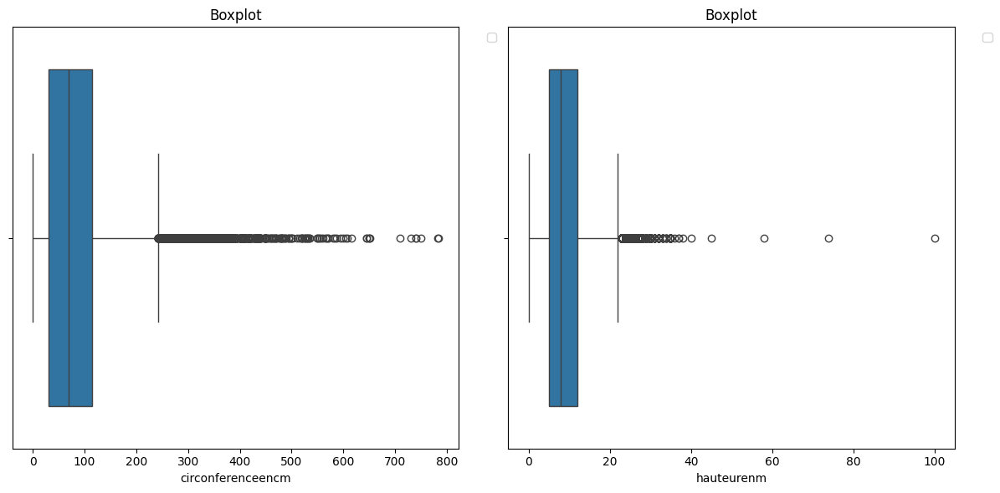

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sélectionner les colonnes pour les boxplots
cols_to_plot = ['circonferenceencm', 'hauteurenm']

# Créer les boxplots avec coloration par espèce
plt.figure(figsize=(12, 6))

for i, col in enumerate(cols_to_plot):
    plt.subplot(1, 2, i + 1)
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [23]:
# Étape 1 : Importer les librairies nécessaires
import plotly.express as px
import plotly.graph_objects as go

# Étape 2 : Sélectionner les colonnes pour le nuage de points
cols_to_plot = ['circonferenceencm', 'hauteurenm']

# Vérifier et convertir les colonnes en numériques si nécessaire
df[cols_to_plot] = df[cols_to_plot].apply(pd.to_numeric, errors='coerce')

# Supprimer les lignes avec des valeurs manquantes dans les colonnes sélectionnées
df_clean = df.dropna(subset=cols_to_plot + ['espece', 'libellefrancais'])

# Étape 3 : Créer le nuage de points principal
fig = px.scatter(
    df_clean,
    x=cols_to_plot[0],
    y=cols_to_plot[1],
    color="espece",
    hover_data=['libellefrancais'],
    title="Nuage de points avec outliers"
)

# Étape 4 : Identifier les outliers avec la méthode IQR
Q1_hauteur = df_clean[cols_to_plot[1]].quantile(0.25)
Q3_hauteur = df_clean[cols_to_plot[1]].quantile(0.75)
IQR_hauteur = Q3_hauteur - Q1_hauteur
lower_bound_hauteur = Q1_hauteur - 1.5 * IQR_hauteur
upper_bound_hauteur = Q3_hauteur + 1.5 * IQR_hauteur

Q1_circonference = df_clean[cols_to_plot[0]].quantile(0.25)
Q3_circonference = df_clean[cols_to_plot[0]].quantile(0.75)
IQR_circonference = Q3_circonference - Q1_circonference
lower_bound_circonference = Q1_circonference - 1.5 * IQR_circonference
upper_bound_circonference = Q3_circonference + 1.5 * IQR_circonference

# Étape 5 : Combiner les outliers des deux colonnes
outliers = df_clean[
    (df_clean[cols_to_plot[1]] < lower_bound_hauteur) | (df_clean[cols_to_plot[1]] > upper_bound_hauteur) |
    (df_clean[cols_to_plot[0]] < lower_bound_circonference) | (df_clean[cols_to_plot[0]] > upper_bound_circonference)
]

# Étape 6 : Vérifier si des outliers ont été détectés
if outliers.empty:
    print("Aucune valeur aberrante détectée.")
else:
    # Étape 7 : Mettre en évidence les outliers dans le graphique
    fig.add_trace(go.Scatter(
        x=outliers[cols_to_plot[0]],
        y=outliers[cols_to_plot[1]],
        mode='markers',
        marker=dict(size=12, color='red', symbol='x'),
        name='Outliers',
        text=outliers['libellefrancais'],
        hovertemplate='<b>%{text}</b><br>Circonférence: %{x}<br>Hauteur: %{y}<extra></extra>'
    ))

# Étape 8 : Afficher le graphique
fig.show()


In [24]:
# Afficher le nombre d'outliers par espèce
outliers_by_species = outliers['espece'].value_counts()
print(outliers_by_species)

# Visualiser la distribution avec un diagramme en barres
import plotly.express as px
fig = px.bar(outliers_by_species, x=outliers_by_species.index, y=outliers_by_species.values,
             title="Nombre d'outliers par espèce")
fig.show()

espece
x hispanica      2682
hippocastanum    1273
orientalis        824
nigra             214
occidentalis      157
                 ... 
avellana            1
x subhirtella       1
glabra              1
indica              1
macrocarpa          1
Name: count, Length: 98, dtype: int64


In [25]:
import plotly.express as px

# Sélectionner les espèces à inclure
selected_species = ['x hispanica', 'hippocastanum', 'orientalis']

# Filtrer le DataFrame
filtered_df = df_clean[df_clean['espece'].isin(selected_species)]

# Créer le nuage de points
fig = px.scatter(filtered_df, x='circonferenceencm', y='hauteurenm', color='espece',
                 size='circonferenceencm', hover_data=['libellefrancais'],
                 title="Nuage de points avec outliers (espèces sélectionnées)")
fig.show()

In [26]:
import plotly.express as px

# Sélectionner les espèces à inclure
selected_species = ['x hispanica', 'hippocastanum', 'orientalis']

# Filtrer le DataFrame
filtered_df = df_clean[df_clean['espece'].isin(selected_species)]

# Calculer le ratio circonférence/hauteur et ajouter une colonne 'ratio'
filtered_df['ratio'] = filtered_df['circonferenceencm'] / filtered_df['hauteurenm']

# Créer un scatter plot avec coloration par espèce
fig = px.scatter(filtered_df, x='circonferenceencm', y='hauteurenm', color='espece',
                 hover_data=['libellefrancais', 'ratio'],
                 title="Circonférence vs. Hauteur par espèce")
fig.show()

<ipython-input-26-1489795906b8>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [27]:
# Filtrer les arbres avec une circonférence supérieure à 700
large_trees = df_clean[df_clean['circonferenceencm'] > 700]

# Trier les arbres par espèce
large_trees_sorted = large_trees.sort_values(by=['espece'])

# Afficher les arbres filtrés et triés
print(large_trees_sorted[['libellefrancais', 'espece', 'circonferenceencm', 'hauteurenm']])

          libellefrancais         espece  circonferenceencm  hauteurenm
11130          Marronnier  hippocastanum                782           7
52529            Peuplier          nigra                750          20
21005   Cerisier à fleurs      serrulata                740           8
16476             Platane    x hispanica                784          33
34006             Platane    x hispanica                710          25
44166             Platane    x hispanica                740          30
112140            Platane    x hispanica                730          35


In [28]:
import plotly.express as px
import pandas as pd

# Sélectionner les espèces à inclure
selected_species = ['x hispanica', 'hippocastanum', 'orientalis']

# Filtrer le DataFrame
filtered_df = df_clean[df_clean['espece'].isin(selected_species)]

# Calculer le ratio circonférence/hauteur et ajouter une colonne 'ratio'
filtered_df['ratio'] = filtered_df['circonferenceencm'] / filtered_df['hauteurenm']

# Créer un scatter plot pour chaque espèce avec les valeurs aberrantes en couleur
for species in selected_species:
    species_df = filtered_df[filtered_df['espece'] == species]

    # Identifier les outliers pour le ratio avec la méthode IQR
    Q1 = species_df['ratio'].quantile(0.25)
    Q3 = species_df['ratio'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = species_df[(species_df['ratio'] < lower_bound) | (species_df['ratio'] > upper_bound)]

    # Créer le scatter plot avec coloration des outliers
    fig = px.scatter(species_df, x='circonferenceencm', y='hauteurenm',
                     color=species_df.index.isin(outliers.index),  # Colorer les outliers
                     color_discrete_map={False: 'blue', True: 'red'},  # Définir les couleurs
                     title=f"Nuage de points pour {species} (outliers en rouge)",
                     hover_data=['libellefrancais', 'ratio'])
    fig.show()

<ipython-input-28-919007a0e0cd>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [29]:
import pandas as pd
import plotly.express as px

# Sélectionner les espèces à inclure
selected_species = ['x hispanica', 'hippocastanum', 'orientalis', 'nigra', 'occidentalis']

# Filtrer le DataFrame
filtered_df = df_clean[df_clean['espece'].isin(selected_species)]

# Calculer le ratio circonférence/hauteur et ajouter une colonne 'ratio'
filtered_df['ratio'] = filtered_df['circonferenceencm'] / filtered_df['hauteurenm']

# Créer un DataFrame pour stocker les outliers
all_outliers = pd.DataFrame()

# Parcourir chaque espèce et identifier les outliers
for species in selected_species:
    species_df = filtered_df[filtered_df['espece'] == species]

    # Identifier les outliers pour le ratio avec la méthode IQR
    Q1 = species_df['ratio'].quantile(0.25)
    Q3 = species_df['ratio'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = species_df[(species_df['ratio'] < lower_bound) | (species_df['ratio'] > upper_bound)]

    # Ajouter les outliers au DataFrame all_outliers
    all_outliers = pd.concat([all_outliers, outliers])

# Supprimer les outliers du DataFrame filtré
filtered_df_no_outliers = filtered_df.drop(all_outliers.index)


<ipython-input-29-17e472322f38>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [30]:
all_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2136 entries, 304 to 211025
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   idbase              2136 non-null   int64  
 1   typeemplacement     2136 non-null   object 
 2   domanialite         2136 non-null   object 
 3   arrondissement      2136 non-null   object 
 4   complementadresse   707 non-null    object 
 5   numero              0 non-null      float64
 6   adresse             2136 non-null   object 
 7   idemplacement       2136 non-null   object 
 8   libellefrancais     2136 non-null   object 
 9   genre               2136 non-null   object 
 10  espece              2136 non-null   object 
 11  varieteoucultivar   96 non-null     object 
 12  circonferenceencm   2136 non-null   int64  
 13  hauteurenm          2136 non-null   int64  
 14  stadedeveloppement  1495 non-null   object 
 15  remarquable         1815 non-null   object 
 16  geo_poi

2136 arbre sont considéré comme outliers

In [31]:
import pandas as pd

# ... (code précédent pour créer filtered_df et filtered_df_no_outliers) ...

# Afficher les statistiques descriptives avant et après suppression des outliers
print("Statistiques descriptives avant suppression des outliers :")
print(filtered_df[['circonferenceencm', 'hauteurenm']].describe().round(2))

print("\nStatistiques descriptives après suppression des outliers :")
print(filtered_df_no_outliers[['circonferenceencm', 'hauteurenm']].describe().round(2))

Statistiques descriptives avant suppression des outliers :
       circonferenceencm  hauteurenm
count           67564.00    67564.00
mean              112.98       12.42
std                70.84        6.17
min                 0.00        0.00
25%                60.00        8.00
50%               105.00       12.00
75%               155.00       16.00
max               784.00       45.00

Statistiques descriptives après suppression des outliers :
       circonferenceencm  hauteurenm
count           65428.00    65428.00
mean              110.32       12.52
std                67.81        6.09
min                 0.00        0.00
25%                60.00        8.00
50%               104.00       12.00
75%               154.00       16.00
max               535.00       45.00


<ipython-input-32-a026178dbd44>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



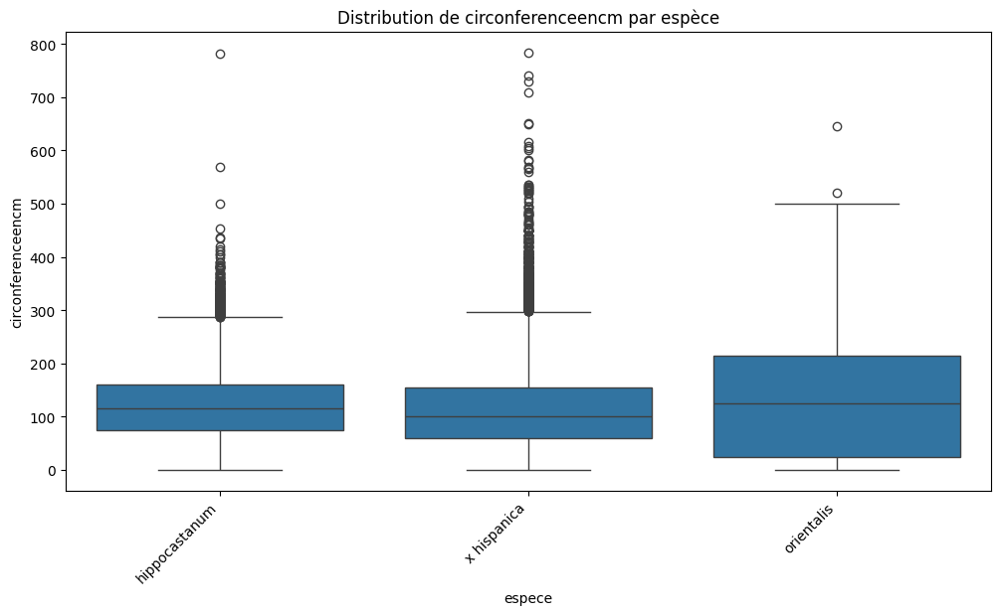

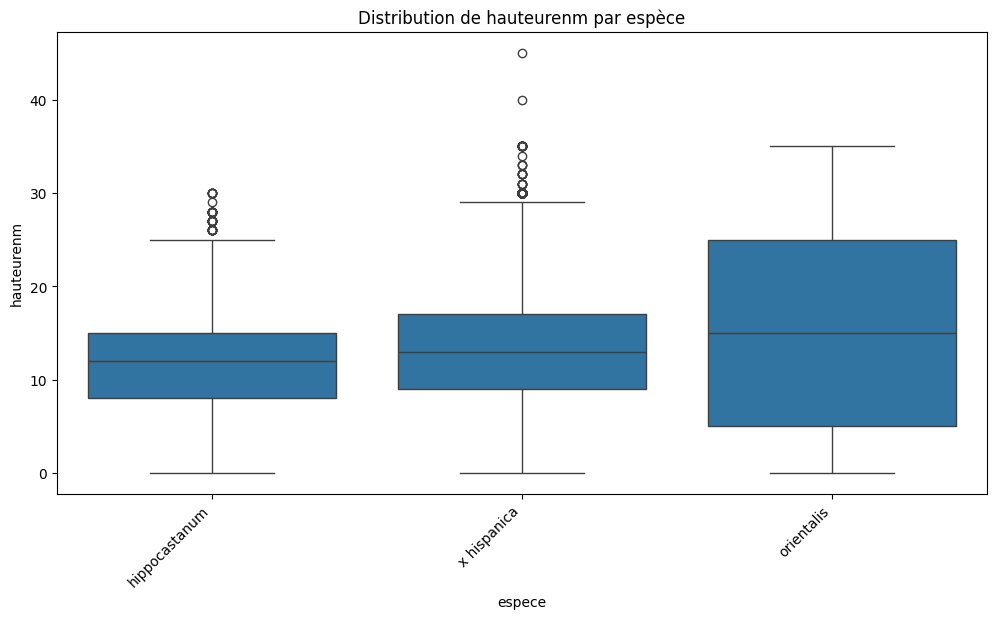

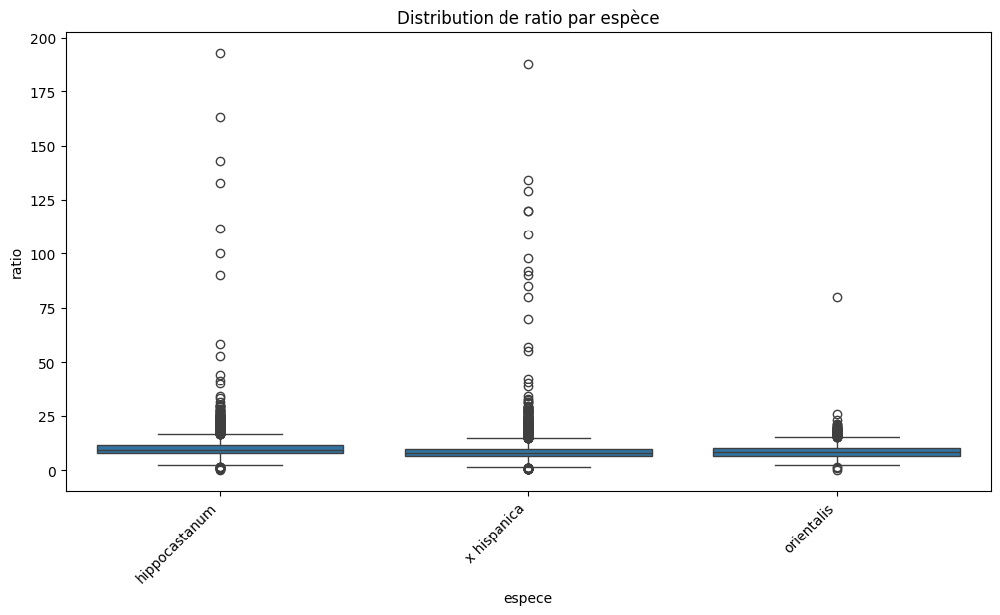

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sélectionner les espèces à inclure
selected_species = ['x hispanica', 'hippocastanum', 'orientalis']

# Filtrer le DataFrame
filtered_df = df_clean[df_clean['espece'].isin(selected_species)]

# Calculer le ratio circonférence/hauteur et ajouter une colonne 'ratio'
filtered_df['ratio'] = filtered_df['circonferenceencm'] / filtered_df['hauteurenm']

# Créer des box plots pour chaque espèce et chaque variable
for variable in ['circonferenceencm', 'hauteurenm', 'ratio']:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='espece', y=variable, data=filtered_df)
    plt.title(f"Distribution de {variable} par espèce")
    plt.xticks(rotation=45, ha='right')  # Rotation des étiquettes de l'axe x
    plt.show()

Le but etant d'organiser les tournée, jene peux supprimer d'arbre de mon df, je prends la décision de conserver ces données et de les remplacer par

In [33]:
filtered_df_transformed = filtered_df_no_outliers.copy()

In [34]:
from sklearn.impute import SimpleImputer

# Créer un imputer pour remplacer les valeurs aberrantes par la médiane
imputer = SimpleImputer(strategy='median')

# Ajuster l'imputer aux données et transformer les données
filtered_df_transformed [['circonferenceencm', 'hauteurenm']] = imputer.fit_transform(filtered_df_no_outliers[['circonferenceencm', 'hauteurenm']])

Mes df

In [35]:

# Calculer les statistiques descriptives pour les trois DataFrames
original_stats = filtered_df[['circonferenceencm', 'hauteurenm']].describe()
no_outliers_stats = filtered_df_no_outliers[['circonferenceencm', 'hauteurenm', 'ratio']].describe()
transformed_stats = filtered_df_transformed[['circonferenceencm', 'hauteurenm', 'ratio']].describe()

# Renommer les index pour les différencier dans le tableau
original_stats.index = pd.MultiIndex.from_product([['Original'], original_stats.index])
no_outliers_stats.index = pd.MultiIndex.from_product([['Sans Outliers'], no_outliers_stats.index])
transformed_stats.index = pd.MultiIndex.from_product([['Transformé'], transformed_stats.index])
transformed_stats


circonferenceencm    hauteurenm         ratio
Transformé count       65428.000000  65428.000000  62141.000000
           mean          110.321407     12.523125      8.499571
           std            67.811112      6.093825      2.596574
           min             0.000000      0.000000      0.666667
           25%            60.000000      8.000000      6.666667
           50%           104.000000     12.000000      8.333333
           75%           154.000000     16.000000     10.000000
           max           535.000000     45.000000     18.500000

Je valide la transformation

In [36]:
transformed_stats

circonferenceencm    hauteurenm         ratio
Transformé count       65428.000000  65428.000000  62141.000000
           mean          110.321407     12.523125      8.499571
           std            67.811112      6.093825      2.596574
           min             0.000000      0.000000      0.666667
           25%            60.000000      8.000000      6.666667
           50%           104.000000     12.000000      8.333333
           75%           154.000000     16.000000     10.000000
           max           535.000000     45.000000     18.500000

In [37]:
# Remplacer les valeurs aberrantes par la moyenne
filtered_df_transformed['circonferenceencm'] = filtered_df_transformed['circonferenceencm'].fillna(filtered_df_no_outliers['circonferenceencm'].mean())
filtered_df_transformed['hauteurenm'] = filtered_df_transformed['hauteurenm'].fillna(filtered_df_no_outliers['hauteurenm'].mean())

In [38]:
 # Nombre d'arbres par espèces dont les données ont été transformées
 filtered_df_transformed[filtered_df_transformed.index.isin(all_outliers.index)]['espece'].value_counts()

,count
espece,


In [39]:

print(filtered_df_transformed.columns)

Index(['idbase', 'typeemplacement', 'domanialite', 'arrondissement',
       'complementadresse', 'numero', 'adresse', 'idemplacement',
       'libellefrancais', 'genre', 'espece', 'varieteoucultivar',
       'circonferenceencm', 'hauteurenm', 'stadedeveloppement', 'remarquable',
       'geo_point_2d', 'ratio'],
      dtype='object')


In [40]:
data = filtered_df_transformed.drop(columns=['complementdresse','numero',"varieteoucultivar"])

KeyError: "['complementdresse'] not found in axis"

In [ ]:
data.sample(5)

# df's

In [ ]:
#df de base = df
#df des valeurs nulles = nan_df
#df valeur aberrantes = all_outliers
#df transformation = filtered_df_transformed
#df final = data

In [ ]:
data

# Visualisation géospatiale : Carte interactive des arbres

In [ ]:
!pip install plotly pandas
import plotly.express as px
import pandas as pd

# Convertir la colonne 'geo_point_2d' en deux colonnes 'latitude' et 'longitude'
df_clean['latitude'] = df_clean['geo_point_2d'].apply(lambda x: x[0] if isinstance(x, list) and len(x) > 0 else None)
df_clean['longitude'] = df_clean['geo_point_2d'].apply(lambda x: x[1] if isinstance(x, list) and len(x) > 0 else None)

# Supprimer les lignes avec des valeurs nulles pour la latitude et la longitude
df_clean = df_clean.dropna(subset=['latitude', 'longitude'])

# Sélectionner les espèces à inclure
selected_species = ['x hispanica', 'hippocastanum', 'orientalis']

# Filtrer le DataFrame
filtered_df = df_clean[df_clean['espece'].isin(selected_species)]

# Grouper par espèce et coordonnées pour compter le nombre d'arbres
grouped_df = filtered_df.groupby(['espece', 'latitude', 'longitude'])['idbase'].count().reset_index(name='nombre_arbres')

# Créer la carte interactive
fig = px.scatter_mapbox(grouped_df,
                        lat='latitude',
                        lon='longitude',
                        color='espece',  # Colorer les points par espèce
                        size='nombre_arbres',  # Taille des points en fonction du nombre d'arbres
                        hover_name='espece',  # Afficher l'espèce au survol
                        hover_data={'latitude': False, 'longitude': False, 'nombre_arbres': True}, # Afficher le nombre d'arbres dans l'infobulle
                        zoom=10,  # Niveau de zoom initial
                        mapbox_style="open-street-map")  # Style de la carte

fig.show()

# Analyse de la biodiversité : Calculs et visualisation de la diversité des espèces

Mes observations

# Organisation des tournées

Quels sont les facteurs les plus importants à prendre en compte pour organiser les tournées (distance, espèce, circonférence, hauteur, etc.) ?
Comment regrouper les arbres pour former des tournées (par espèce, par zone géographique, par taille, etc.) ?
Y a-t-il des contraintes spécifiques à respecter (nombre maximum d'arbres par tournée, distance maximale entre les arbres, etc.) ?



Recherche de données concernant les espèces sur le web (Besoin en eau)

# Conclusion et synthèse : Résumé des résultats et implications pour l'optimisation des tournées